<h1>Chapter 9 - Multimodal Large Language Models</h1>
<i>Adding vision capabilities to Large Language Models.</i>

<a href="https://www.amazon.com/Hands-Large-Language-Models-Understanding/dp/1098150961"><img src="https://img.shields.io/badge/Buy%20the%20Book!-grey?logo=amazon"></a>
<a href="https://www.oreilly.com/library/view/hands-on-large-language/9781098150952/"><img src="https://img.shields.io/badge/O'Reilly-white.svg?logo=data:image/svg%2bxml;base64,PHN2ZyB3aWR0aD0iMzQiIGhlaWdodD0iMjciIHZpZXdCb3g9IjAgMCAzNCAyNyIgZmlsbD0ibm9uZSIgeG1sbnM9Imh0dHA6Ly93d3cudzMub3JnLzIwMDAvc3ZnIj4KPGNpcmNsZSBjeD0iMTMiIGN5PSIxNCIgcj0iMTEiIHN0cm9rZT0iI0Q0MDEwMSIgc3Ryb2tlLXdpZHRoPSI0Ii8+CjxjaXJjbGUgY3g9IjMwLjUiIGN5PSIzLjUiIHI9IjMuNSIgZmlsbD0iI0Q0MDEwMSIvPgo8L3N2Zz4K"></a>
<a href="https://github.com/HandsOnLLM/Hands-On-Large-Language-Models"><img src="https://img.shields.io/badge/GitHub%20Repository-black?logo=github"></a>
[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/HandsOnLLM/Hands-On-Large-Language-Models/blob/main/chapter09/Chapter%209%20-%20Multimodal%20Large%20Language%20Models.ipynb)

---

This notebook is for Chapter 9 of the [Hands-On Large Language Models](https://www.amazon.com/Hands-Large-Language-Models-Understanding/dp/1098150961) book by [Jay Alammar](https://www.linkedin.com/in/jalammar) and [Maarten Grootendorst](https://www.linkedin.com/in/mgrootendorst/).

---

<a href="https://www.amazon.com/Hands-Large-Language-Models-Understanding/dp/1098150961">
<img src="https://raw.githubusercontent.com/HandsOnLLM/Hands-On-Large-Language-Models/main/images/book_cover.png" width="350"/></a>

### [OPTIONAL] - Installing Packages on <img src="https://colab.google/static/images/icons/colab.png" width=100>

If you are viewing this notebook on Google Colab (or any other cloud vendor), you need to **uncomment and run** the following codeblock to install the dependencies for this chapter:

---

💡 **NOTE**: We will want to use a GPU to run the examples in this notebook. In Google Colab, go to
**Runtime > Change runtime type > Hardware accelerator > GPU > GPU type > T4**.

---


In [ ]:
# %%capture
# !pip install matplotlib transformers datasets accelerate sentence-transformers

**能够处理不同类型数据的模型，例如图像、音频、视频或传感器数据，被称为多模态模型**。在本章中，我们将探讨具有多模态能力的几种大语言模型，以及这些能力对实际应用的意义。

# 一 Vision Transformer(VIT)

ViT介绍：https://zhuanlan.zhihu.com/p/427388113

在之前，我们已经看到了基于Transformer的模型在各种语言建模任务中的成功应用，从分类和聚类到搜索和生成建模。因此，研究人员通过寻找方法来将Transformer的一些成功通用化到计算机视觉领域，这一动向并不令人惊讶。他们提出的方法称为视觉Transformer（ViT），在图像识别任务中相比于先前的默认卷积神经网络（CNNs）表现卓越。如图9-2所示，ViT与原始Transformer一样，被用来将图像这种非结构化数据转化为可以用于多种任务的表示，如分类。ViT依赖于Transformer架构中的一个重要组成部分，即编码器。正如我们在第1章中看到的，编码器负责将文本输入转换为数值表示，然后再传递给解码器。然而，在编码器执行其功能之前，文本输入需要先进行标记化处理，如图9-3所示。

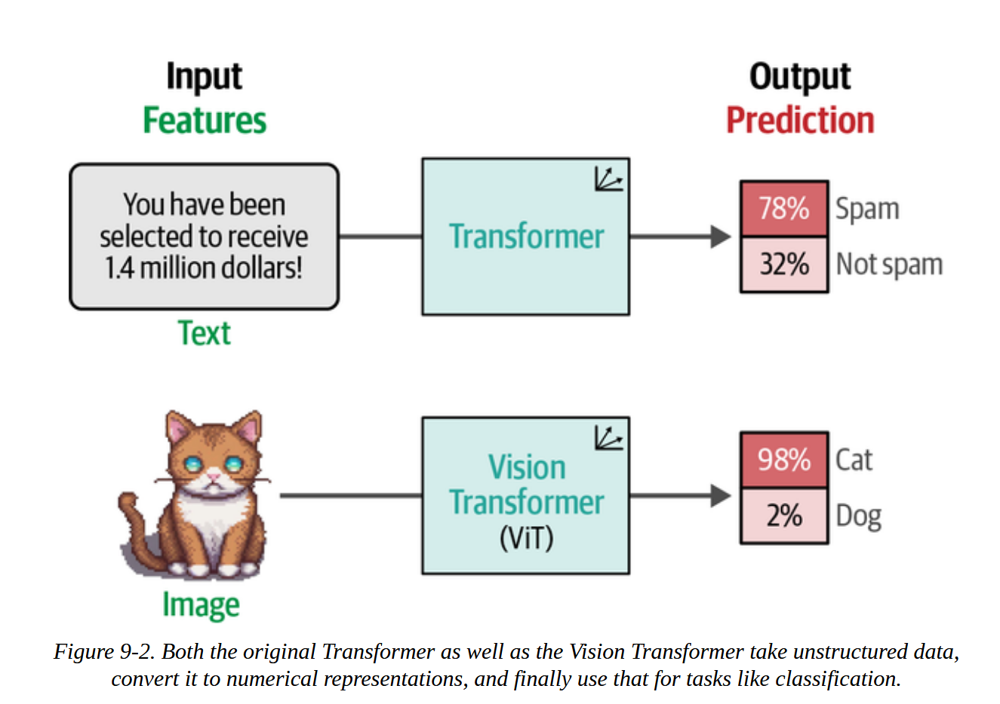

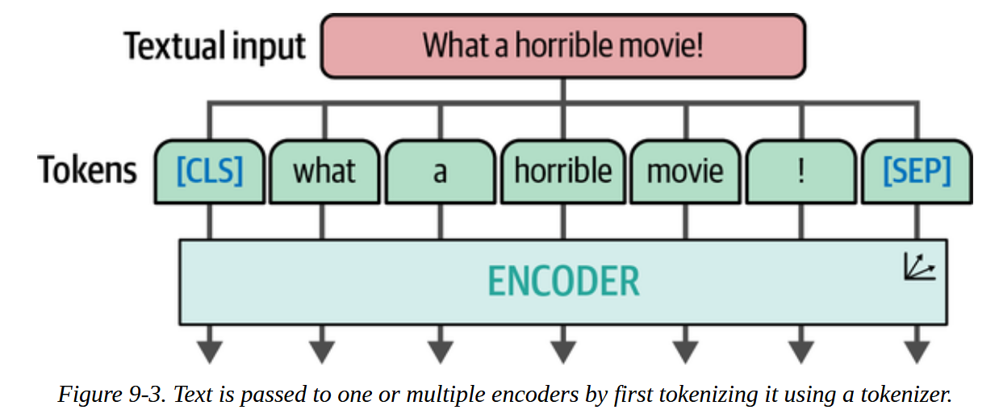

由于图像不由单词组成，因此这种分词过程无法用于视觉数据。相反，ViT的作者提出了一种将图像分词为“词汇”的方法，这使得他们可以使用原始的编码器结构。比如你有一张猫的图片，这个图片由若干像素组成，比如说是512×512个像素。每个单独的像素并不传达太多信息，但当你将多个像素块组合在一起时，你会慢慢看到更多的信息。ViT使用的就是类似的原理。它通过图9-4所示的方式在水平和垂直方向上把图像切割成若干块。**图像输入的“标记化”过程是将一幅图像转换成若干个子图像块**。

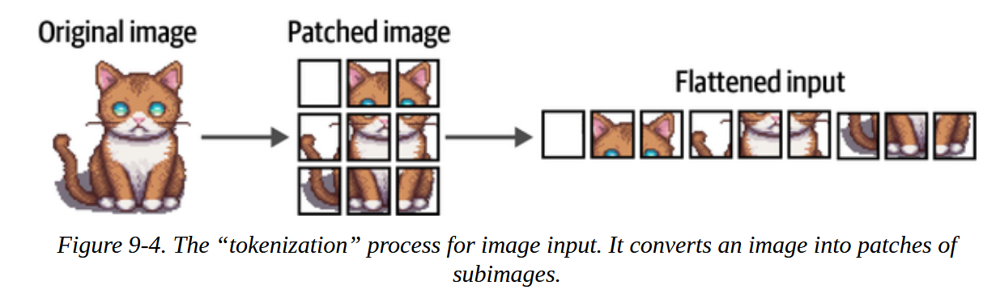

就像我们将文本转换为多个文本标记一样，我们也将图像转换为多个图像补丁。被拉平的图像补丁输入可以被视为文本中的标记。然而，与标记不同的是，我们不能为每个图像补丁简单地分配一个ID，因为这些补丁很少会在其他图像中出现，这不同于文本的词汇。而是将这些补丁线性嵌入以创建数值表示。这些嵌入可以用作Transformer模型的输入。这样，图像补丁就被与标记相同的方式处理。这种方法的有趣之处在于，一旦嵌入传递到编码器，它们就像文本标记一样被处理。从那一刻起，文本和图像的训练方式没有任何区别。由于这些相似性，视觉Transformer（ViT）常常被用于将各种语言模型转化为多模态模型。**ViT背后的主要算法：图像经过切割并进行线性投影后，得到的补丁嵌入被传递到编码器，并像文本标记一样进行处理**。

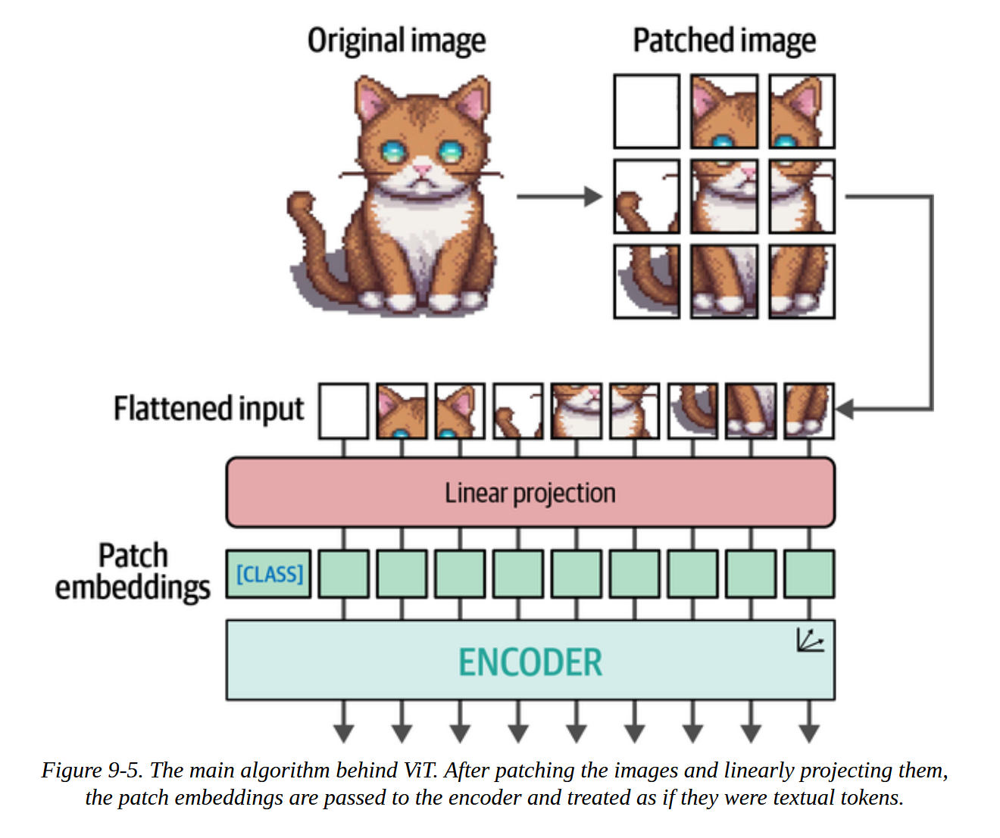

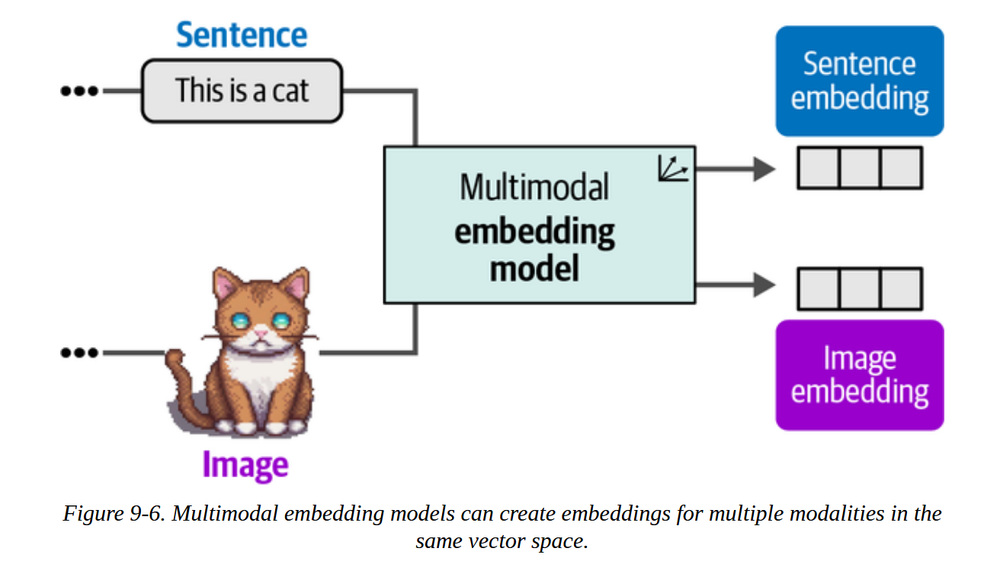

多模态嵌入模型可以在同一向量空间中为多种模态创建嵌入。一个优势是这允许比较多模态表示，因为生成的嵌入位于相同的向量空间。尽管来自不同的模态，但具有相似意义的嵌入在向量空间中会彼此接近，如图9-7所示。

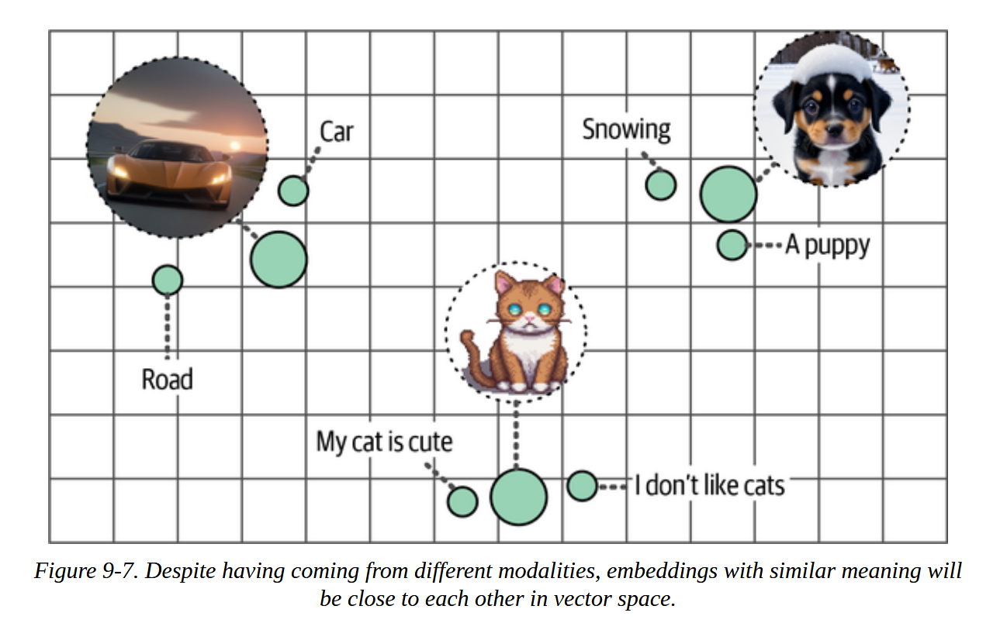

目前有许多多模态嵌入模型，但最为知名和广泛使用的模型是对比语言-图像预训练模型（CLIP）。

# 二 CLIP

CLIP介绍：https://zhuanlan.zhihu.com/p/493489688

CLIP（Contrastive Language-Image Pretraining）是一个嵌入模型，可以计算图像和文本的嵌入。生成的嵌入位于相同的向量空间中，这意味着图像的嵌入可以与文本的嵌入进行比较。此比较能力使得CLIP及类似模型可以用于以下任务：

Zero-shot 分类：我们可以将图像的嵌入与其可能类别的描述嵌入进行比较，来找出与之最相似的类别。

聚类：对图像和关键词集合同时进行聚类，从而确定哪些关键词属于哪些图像集合。

搜索：在数十亿篇文本或图像中，我们可以快速找到与输入文本或图像相关的内容。

生成：使用多模态嵌入来推动图像的生成。

CLIP如何生成多模态嵌入？

想象一下，你有一个包含数百万张图像和相应说明文字的数据集，如图9-8所示。该数据集可以用来为每一对生成两个表示，即图像及其标题。为此，CLIP使用文本编码器来嵌入文本，使用图像编码器来嵌入图像。如图9-9所示，结果是为图像及其对应的标题生成嵌入。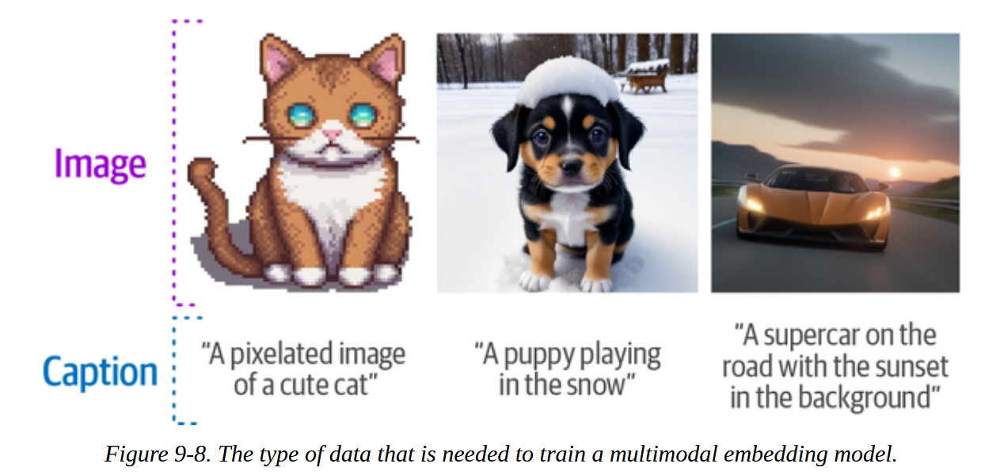
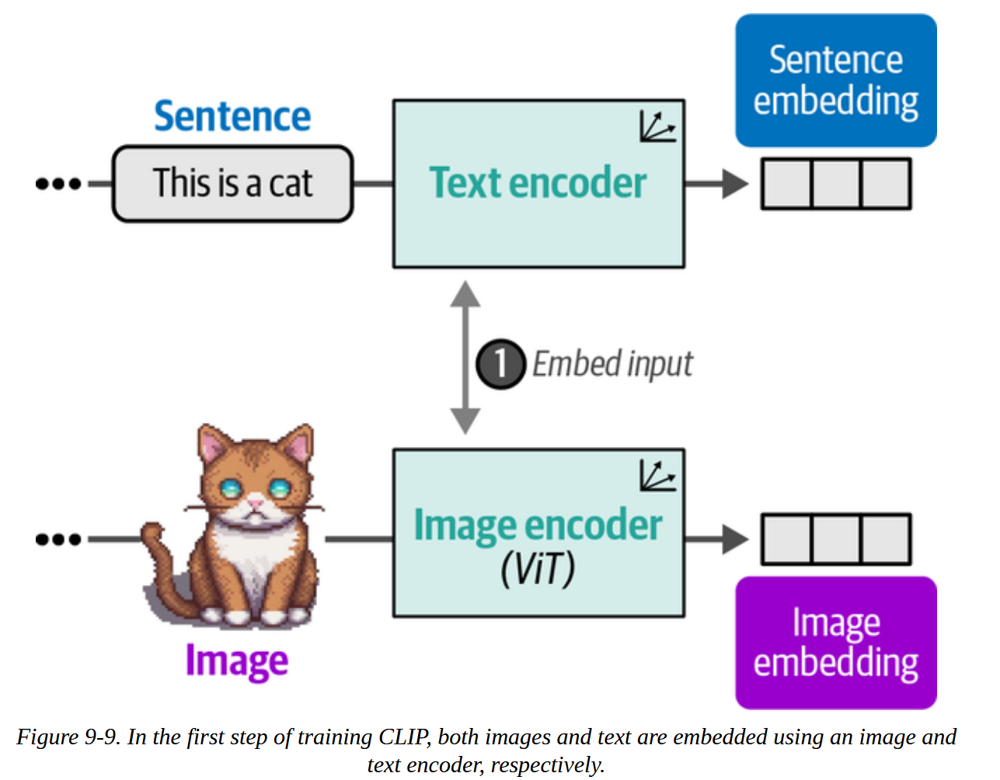

在训练CLIP的第一步中，图像和文本分别使用图像编码器和文本编码器进行嵌入。

在训练CLIP的第二步中，使用余弦相似性计算句子嵌入和图像嵌入之间的相似性。
生成的嵌入对通过余弦相似性进行比较。当我们开始训练时，图像嵌入和文本嵌入之间的相似性会较低，因为它们尚未优化到同一向量空间。在训练过程中，我们优化嵌入之间的相似性，期望最大化相似图像标题对的相似性，并最小化不相似图像标题对的相似性（图9-10）。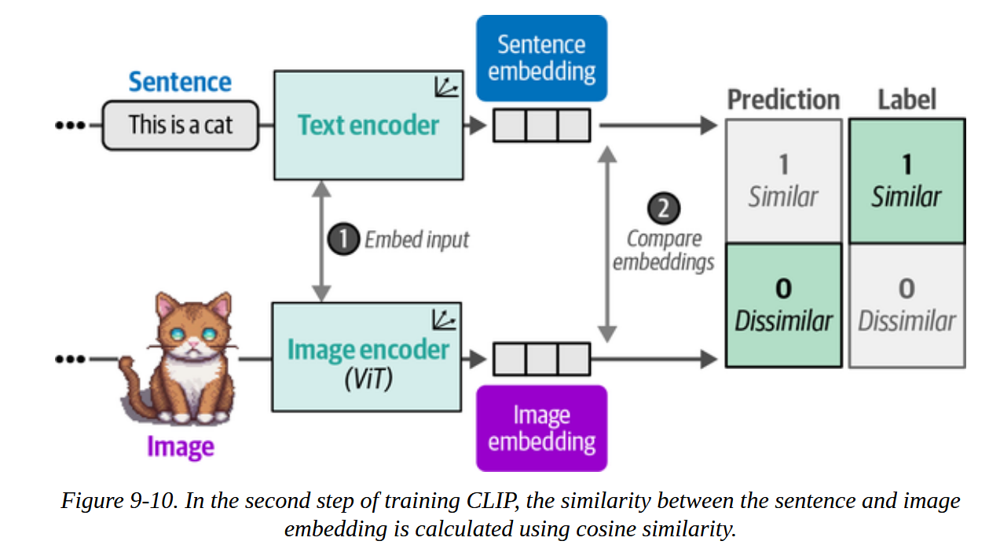

在训练CLIP的第三步中，文本和图像编码器会根据预期的相似性进行更新。这样就更新了嵌入表示，如果输入是相似的，它们在向量空间中的距离会更接近。
在计算其相似性之后，模型会被更新，接着以新的数据批次和更新后的表示重新开始该过程（图9-11）。这种方法称为对比学习，我们将在第10章详细探讨其内部工作机制，并创建我们自己的嵌入模型。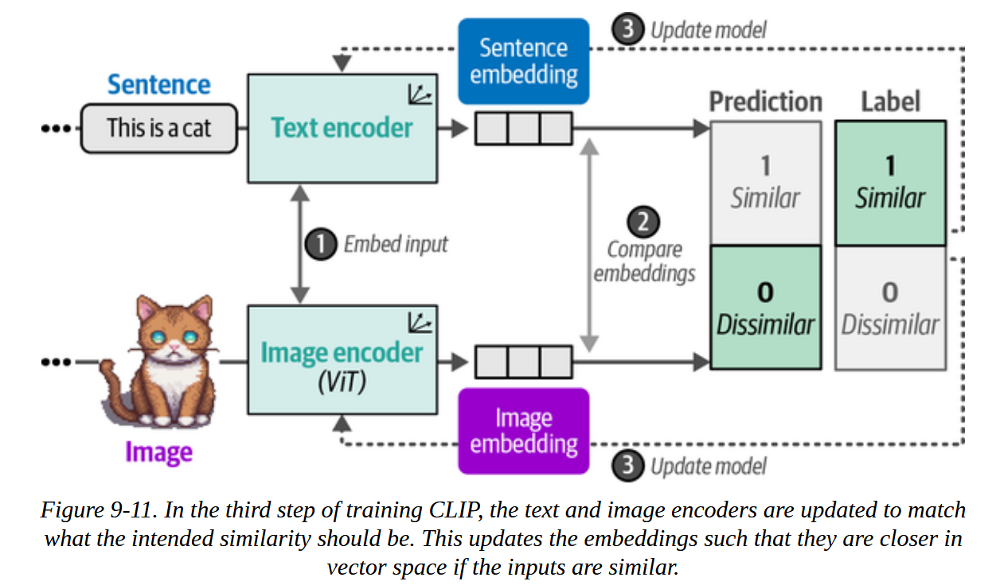

最终，我们希望一张猫的图像嵌入能够与短语“a picture of a cat”的嵌入相似。为了确保表示尽可能准确，训练过程中还应包括无关的图像和标题作为负样本。建模相似性不仅在于知道使事物彼此相似的因素是什么，还在于认识到使它们不同和不相似的因素。

# 三 OpenCLIP
对于下一个例子，我们将使用CLIP的开源变体之一，即OpenCLIP。使用OpenCLIP或任何CLIP模型可以概括为两点：在将文本和图像输入传递给主模型之前对其进行处理。在这样做之前，我们先来看一个小例子，我们将使用之前所见的一张图像，一只小狗在雪地玩耍，如图所示。由于我们有这张图像的标题，因此可以使用OpenCLIP为两者生成嵌入。为此，我们需要加载三个模型：一个用于对文本输入进行分词的分词器，一个用于预处理和调整图像大小的预处理器，以及将前面输出转换为嵌入的主模型。

In [ ]:
from urllib.request import urlopen
from PIL import Image

# 加载一张人工智能生成的小狗在雪地玩耍的图像
puppy_path = "https://raw.githubusercontent.com/HandsOnLLM/Hands-On-Large-Language-Models/main/chapter09/images/puppy.png"
image = Image.open(urlopen(puppy_path)).convert("RGB")
caption = "a puppy playing in the snow"

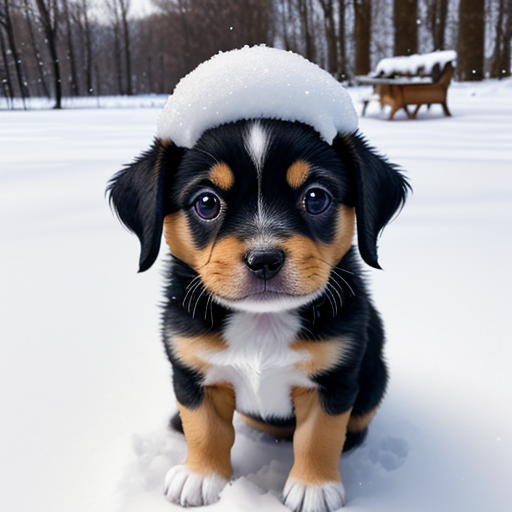

In [ ]:
image

### 嵌入

ViT模型性能对比：https://zhuanlan.zhihu.com/p/10439436673

In [ ]:
from transformers import CLIPTokenizerFast, CLIPProcessor, CLIPModel

model_id = "openai/clip-vit-base-patch32"

# 加载一个分词器以预处理文本
clip_tokenizer = CLIPTokenizerFast.from_pretrained(model_id)

# 加载一个处理器来预处理图像
clip_processor = CLIPProcessor.from_pretrained(model_id)

# 生成文本和图像嵌入的主模型
model = CLIPModel.from_pretrained(model_id)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

先从分词器开始，看看预处理我们的输入会发生什么，这将输出一个包含输入ID的字典。

In [ ]:
inputs = clip_tokenizer(caption, return_tensors="pt") # 对输入进行分词

In [ ]:
inputs

{'input_ids': tensor([[49406,   320,  6829,  1629,   530,   518,  2583, 49407]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1]])}

要了解这些ID代表什么，我们可以使用一个名为convert_ids_to_tokens的功能将它们转换为标记。此外，我们还可以看到，文本的开始和结束位置被标识出来。

In [ ]:
# 将我们的输入转换回标记
clip_tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])

['<|startoftext|>',
 'a</w>',
 'puppy</w>',
 'playing</w>',
 'in</w>',
 'the</w>',
 'snow</w>',
 '<|endoftext|>']

现在我们已经对标题进行了预处理，我们可以创建嵌入：这会为该字符串生成一个包含512个数值的嵌入向量.

In [ ]:
# 创建一个文本嵌入
text_embedding = model.get_text_features(**inputs)
text_embedding.shape

torch.Size([1, 512])

在我们生成图像嵌入之前，像文本嵌入一样，我们需要对图像进行预处理，因为模型希望输入图像具有特定的特征，比如大小和形状。为此，我们可以使用之前创建的处理器。原始图像的尺寸为512 x 512像素。请注意，对该图像进行预处理后，其大小被缩小到224 x 224像素，因为这是其预期的尺寸。

In [ ]:
# 图像预处理
processed_image = clip_processor(
    text=None, images=image, return_tensors='pt'
)['pixel_values']

processed_image.shape

torch.Size([1, 3, 224, 224])

让我们将此预处理的结果可视化，如下图所示。

(-0.5, 223.5, 223.5, -0.5)

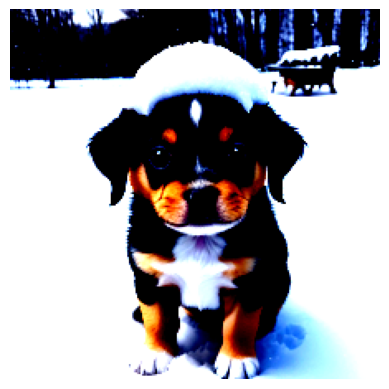

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# 为可视化准备图像
img = processed_image.squeeze(0)
img = img.permute(*torch.arange(img.ndim - 1, -1, -1))
img = np.einsum('ijk->jik', img)

# 可视化预处理后的图像
plt.imshow(img)
plt.axis('off')

要将此预处理后的图像转换为嵌入，我们可以像之前一样调用模型，并查看其返回的形状是什么。请注意，生成的图像嵌入的形状与文本嵌入的形状相同。这一点很重要，因为它允许我们比较它们的嵌入，看它们是否相似。我们可以利用这些嵌入来计算它们的相似程度。为此，我们首先对嵌入进行归一化处理，然后计算点积，以获得相似性得分。

In [ ]:
# 创建图像嵌入
image_embedding = model.get_image_features(processed_image)
image_embedding.shape

torch.Size([1, 512])

In [ ]:
# 归一化嵌入向量
text_embedding /= text_embedding.norm(dim=-1, keepdim=True)
image_embedding /= image_embedding.norm(dim=-1, keepdim=True)

# 计算它们的相似性
text_embedding = text_embedding.detach().cpu().numpy()
image_embedding = image_embedding.detach().cpu().numpy()
score = text_embedding @ image_embedding.T
score

array([[0.33149636]], dtype=float32)

我们得到一个相似度分数为0.33，鉴于我们不了解模型如何定义低相似度和高相似度的分数，这个结果较难解读。相反，我们可以通过添加更多的图像和标题来扩展这个示例，如图9-14所示。考虑到与其他图像的相似度分数要低得多，0.33的得分似乎确实很高。三幅图像和三个标题之间的相似度矩阵如图所示。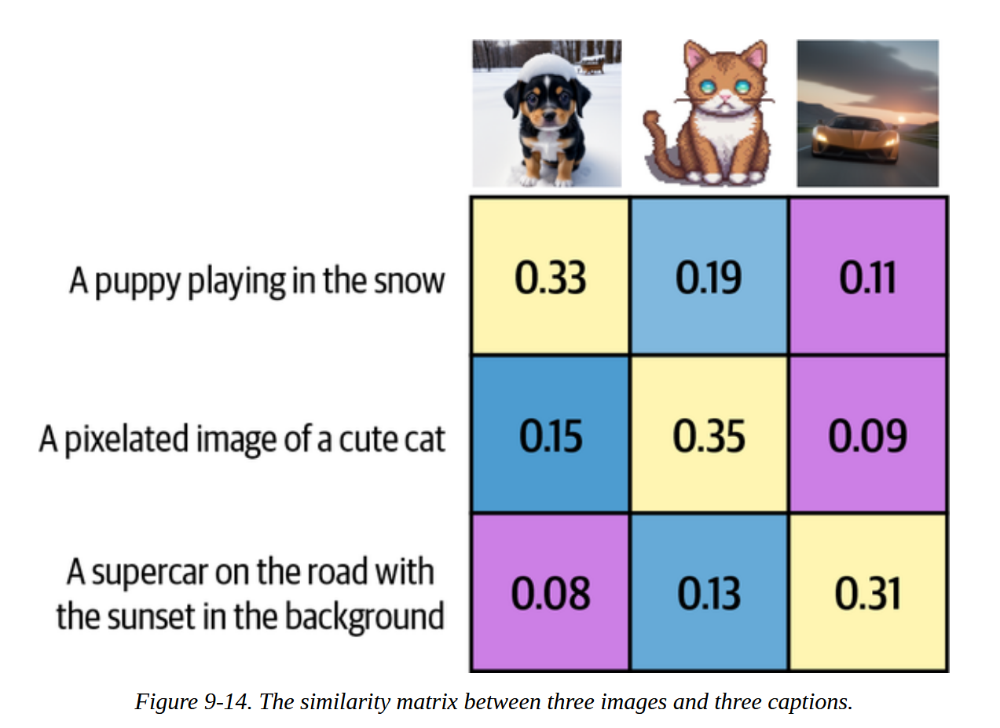

In [ ]:
from urllib.request import urlopen
from PIL import Image

cat_path = "https://raw.githubusercontent.com/HandsOnLLM/Hands-On-Large-Language-Models/main/chapter09/images/cat.png"
car_path = "https://raw.githubusercontent.com/HandsOnLLM/Hands-On-Large-Language-Models/main/chapter09/images/car.png"
paths = [puppy_path, cat_path, car_path]
images = [Image.open(urlopen(path)).convert("RGBA") for path in paths]
captions = [
    "a puppy playing in the snow",
    "a pixelated image of a cute cat",
    "A supercar on the road \nwith the sunset in the background"
]

import numpy as np

# 嵌入所有图像
image_embeddings = []
for image in images:
  image_processed = clip_processor(images=image, return_tensors='pt')['pixel_values']
  image_embedding = model.get_image_features(image_processed).detach().cpu().numpy()[0]
  image_embeddings.append(image_embedding)
image_embeddings = np.array(image_embeddings)

# 嵌入所有文字说明
text_embeddings = []
for caption in captions:
  inputs = clip_tokenizer(caption, return_tensors="pt")
  text_emb = model.get_text_features(**inputs).detach().cpu().numpy()[0]
  text_embeddings.append(text_emb)
text_embeddings = np.array(text_embeddings)

In [ ]:
# 计算图像与文本说明之间的余弦相似度
from sklearn.metrics.pairwise import cosine_similarity
sim_matrix = cosine_similarity(image_embeddings, text_embeddings)

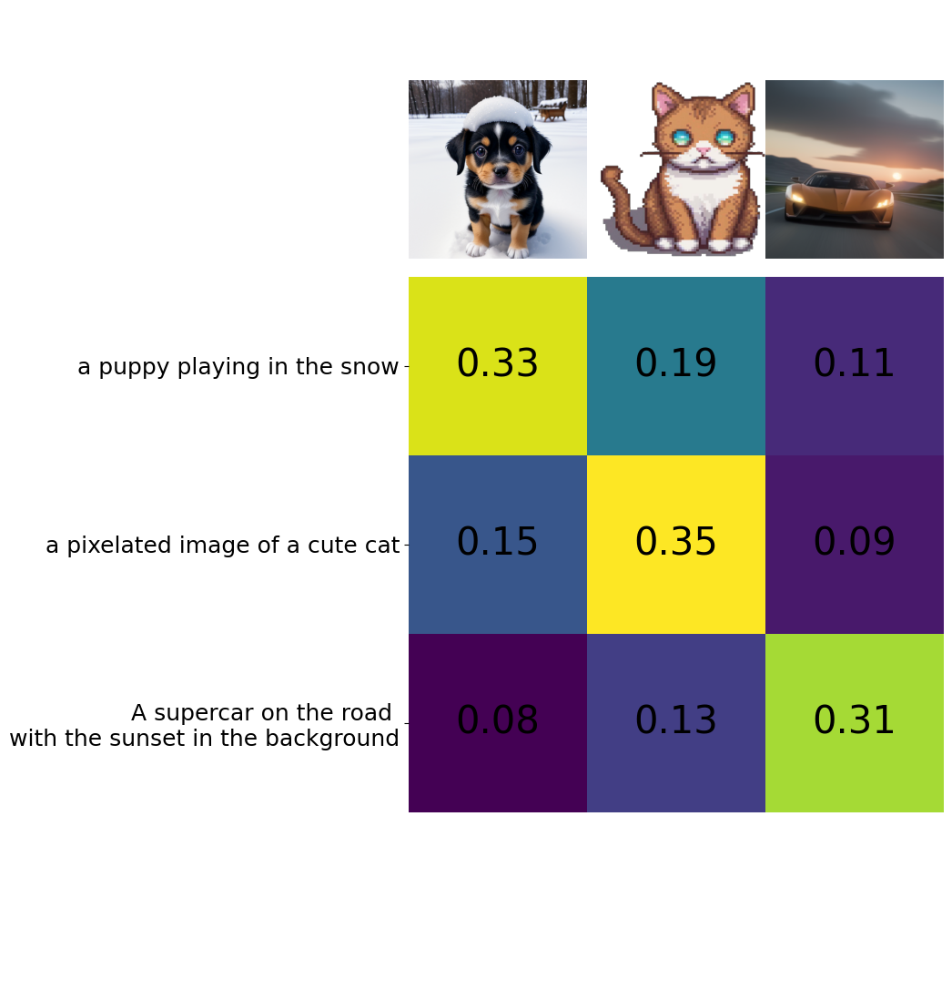

In [ ]:
# 创建基础图形
plt.figure(figsize=(20, 14))
plt.imshow(sim_matrix, cmap='viridis')

# 调整刻度并使用正确的标签
plt.yticks(range(len(captions)), captions, fontsize=18)
plt.xticks([])

# 可视化
for i, image in enumerate(images):
    plt.imshow(image, extent=(i - 0.5, i + 0.5, -1.6, -0.6), origin="lower")

# 在正确的索引位置添加文本说明
for x in range(sim_matrix.shape[1]):
    for y in range(sim_matrix.shape[0]):
        plt.text(x, y, f"{sim_matrix[y, x]:.2f}", ha="center", va="center", size=30)

# 移除不必要的脊线
for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

# 调整块的大小
plt.xlim([-0.5, len(captions) - 0.5])
plt.ylim([len(captions) + 0.5, -2])
# plt.title("Similarity Matrix", size=20)
plt.savefig("sim_matrix.png", dpi=300, bbox_inches='tight')

### SBERT

使用sentence-transformers加载CLIP

sentence-transformers实现了一些基于CLIP的模型，这些模型使得创建嵌入变得更加简单。只需几行代码即可完成.

In [ ]:
from sentence_transformers import SentenceTransformer, util

# 加载与SBERT兼容的CLIP模型
model = SentenceTransformer('clip-ViT-B-32')

# 编码图像
image_embeddings = model.encode(images)

# 编码文本说明 
text_embeddings = model.encode(captions)

# 计算余弦相似度
sim_matrix = util.cos_sim(image_embeddings, text_embeddings)
print(sim_matrix)

modules.json:   0%|          | 0.00/122 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/1.91k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

0_CLIPModel/config.json:   0%|          | 0.00/4.03k [00:00<?, ?B/s]

0_CLIPModel/special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

0_CLIPModel/vocab.json:   0%|          | 0.00/961k [00:00<?, ?B/s]

0_CLIPModel/tokenizer_config.json:   0%|          | 0.00/604 [00:00<?, ?B/s]

0_CLIPModel/preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

0_CLIPModel/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tensor([[0.3315, 0.1863, 0.1084],
        [0.1488, 0.3463, 0.0947],
        [0.0762, 0.1260, 0.3098]])


# 四 BLIP-2

传统上，文本生成模型主要是用于解释文本表示的模型。像 Llama 2 和 ChatGPT 这样的模型在理解文本信息和用自然语言回应方面表现出色。然而，它们的局限性在于只能处理它们所训练的模态，即文本。正如我们在多模态嵌入模型中所见，增加视觉元素可以增强模型的能力。对于文本生成模型来说，我们希望它能够对某些输入图像进行推理。例如，我们可以给它一张披萨的图片，问它包含了哪些成分。或者展示给它一张埃菲尔铁塔的照片，询问它的建造时间或所在地。这种对话能力在图 9-15 中得到了进一步的说明。为弥合这两个领域之间的差距，人们尝试将多模态形式引入现有模型。其中一种方法被称为 BLIP-2（Bootstrapping Language-Image Pre-training 2），即引导语言-图像预训练，以实现统一的视觉-语言理解与生成。BLIP-2 是一种易于使用的模块化技术，可以为现有语言模型引入视觉能力。

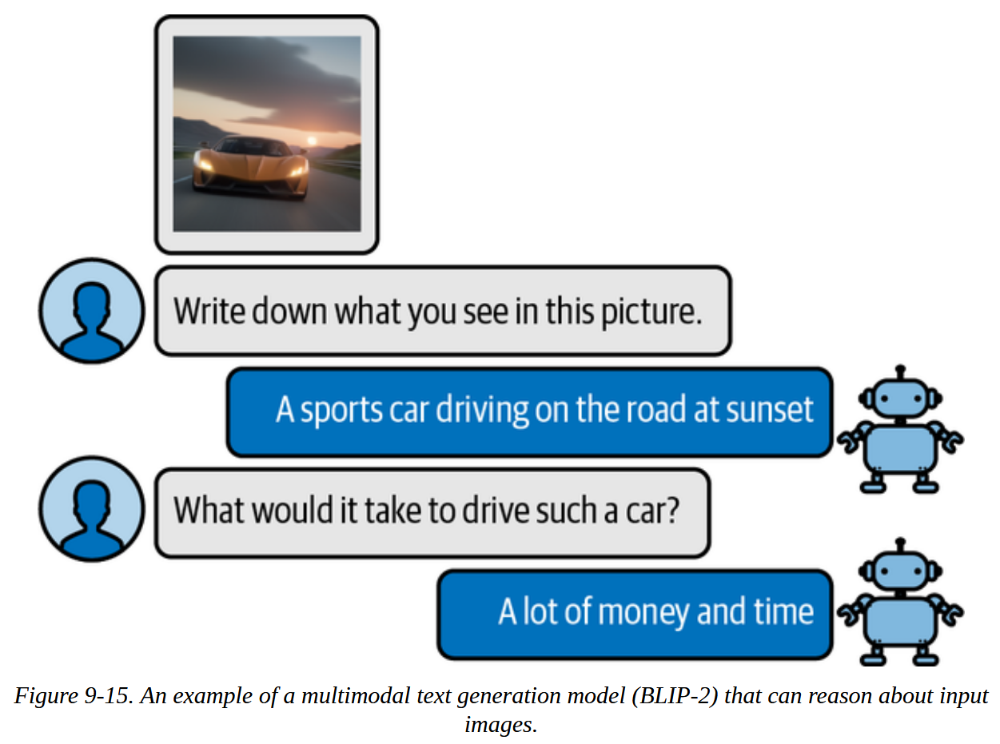

从零开始创建一个多模态语言模型需要大量的计算能力和数据。我们必须使用数十亿的图像、文本以及图文对来构建这样的模型。可以想象，这并不容易实现！BLIP-2 并没有从零开始构建架构，而是通过构建一个名为查询变换器（Q-Former）的桥梁来弥合视觉和语言之间的差距，该桥梁连接了一个预训练的图像编码器和一个预训练的大语言模型。通过利用预训练模型，BLIP-2 只需要训练这个桥梁，而无需从头训练图像编码器和大语言模型。这样就充分利用了现有的技术和模型！

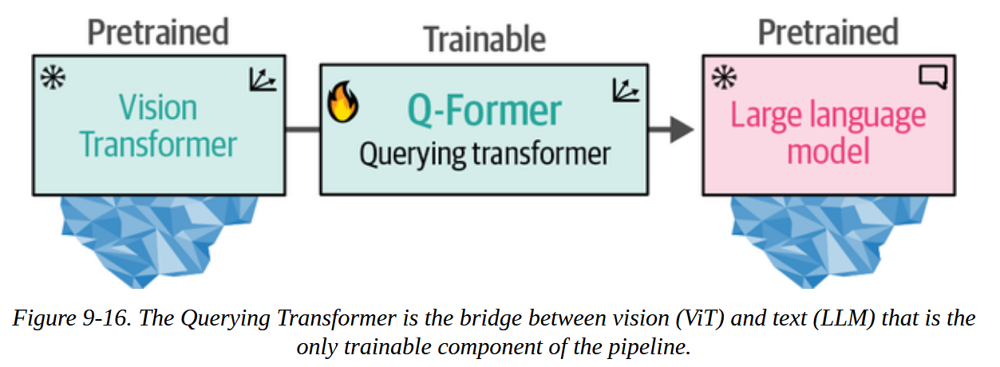

Q-Former的训练分为两个阶段，每个阶段对应一种模态，如图9-17和9-18所示。在步骤1中，使用图像-文本对来训练Q-Former，使其能够同时表示图像和文本。这些对通常是图像的描述，就像我们在训练CLIP时所见到的一样。图像被输入到冻结的视觉变换器（即它的参数保持不变，只用于提取图像特征）中，以提取视觉嵌入。这些嵌入作为Q-Former的视觉变换器的输入。描述则作为Q-Former的文本变换器的输入。根据这些输入，Q-Former随后在以下三个任务上进行训练：

图像-文本对比学习:使得相关的图像和文本之间的相似度得以最大化，而不相关的图像和文本则被推向最小化。

图像-文本匹配:用于预测图像和文本对是正样本（匹配）还是负样本（不匹配）。

基于图像的文本生成:训练模型根据从输入图像中提取的信息生成文本。

这三个目标被联合优化，以改进从冻结的视觉变换器中提取的视觉表示。

表示学习：视觉变换器（ViT）和文本变换器（Text Transformer）分别从图像和文本中提取表示。

生成学习：Q-Former和大语言模型（LLM）负责根据这些表示生成文本描述或回答问题。

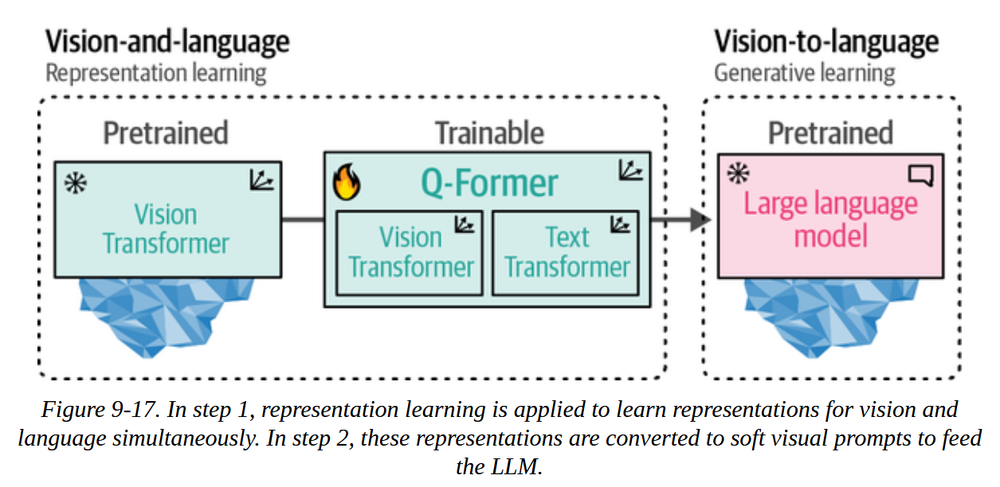

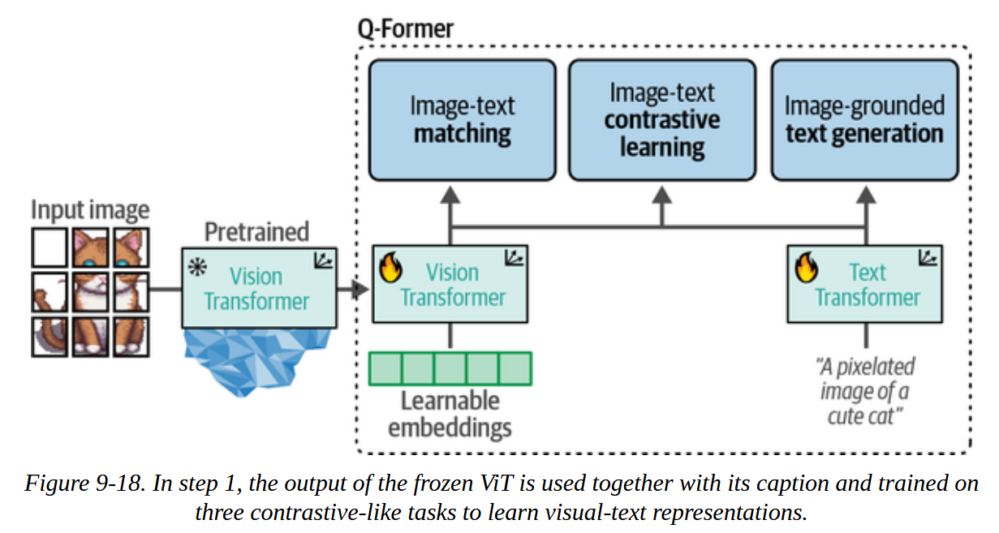

如图9-19所示，在第二步中，从步骤1中获得的可学习嵌入现在包含了与对应文本信息相同维度空间的视觉信息。可学习嵌入通过投影层转化为投影嵌入，这些投影嵌入作为“软视觉提示”传递给大语言模型。投影层的作用是将视觉信息转换成大语言模型能够理解的格式，从而帮助生成与图像相关的自然语言文本。

**硬提示**：是通过直接提供固定的文本提示来引导模型生成内容。例如，在图像生成任务中，给定“这是一只猫”的文本提示，模型会生成相应的图像描述。

**软提示**：软提示则是通过学习得到的嵌入（或向量表示）来引导模型，而不是使用固定的文本。这些嵌入是动态生成的，并通过模型的训练过程进行优化，以适应具体任务的需求。

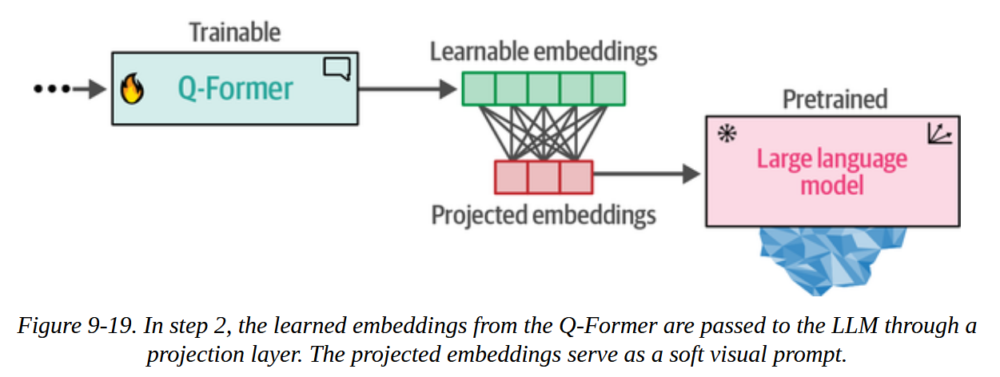

当我们将这些步骤结合在一起时，它使得Q-Former可以在相同的维度空间中学习视觉和文本表示，这些表示可以作为大语言模型的软提示。因此，LLM将以类似于您在提示时为其提供上下文的方式获得有关图像的信息。完整的深入过程如图9-20所示。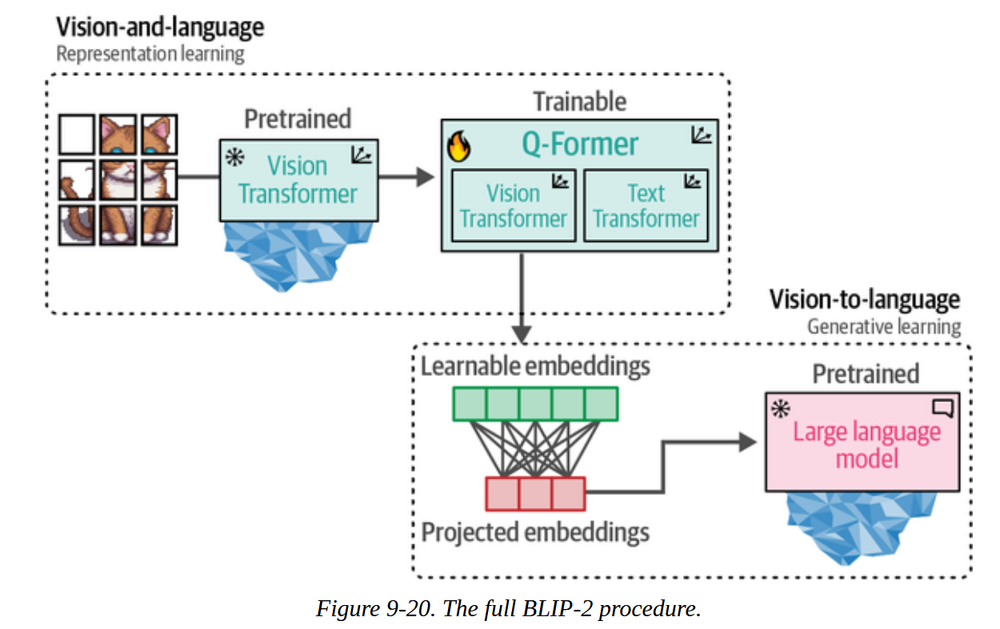

既然我们了解了BLIP-2的创建过程，这种模型有许多有趣的应用案例，不仅限于为图像生成标题、回答视觉问题，甚至可以用于提示生成。在我们探索一些应用案例之前，先加载该模型并了解如何使用它：我们加载了组成完整流程的两个组件：一个处理器和一个模型。处理器可以类比于语言模型中的分词器。它将非结构化输入（如图像和文本）转换为模型通常期望的表示形式。

In [ ]:
from transformers import AutoProcessor, Blip2ForConditionalGeneration
import torch

# 加载处理器和主模型
blip_processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")
model = Blip2ForConditionalGeneration.from_pretrained(
    "Salesforce/blip2-opt-2.7b",
    torch_dtype=torch.float16
)

# 将模型发送到GPU以加速推理
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

preprocessor_config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/904 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.11M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/6.96k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/127k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/10.0G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/5.50G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Blip2ForConditionalGeneration(
  (vision_model): Blip2VisionModel(
    (embeddings): Blip2VisionEmbeddings(
      (patch_embedding): Conv2d(3, 1408, kernel_size=(14, 14), stride=(14, 14))
    )
    (encoder): Blip2Encoder(
      (layers): ModuleList(
        (0-38): 39 x Blip2EncoderLayer(
          (self_attn): Blip2Attention(
            (dropout): Dropout(p=0.0, inplace=False)
            (qkv): Linear(in_features=1408, out_features=4224, bias=True)
            (projection): Linear(in_features=1408, out_features=1408, bias=True)
          )
          (layer_norm1): LayerNorm((1408,), eps=1e-06, elementwise_affine=True)
          (mlp): Blip2MLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=1408, out_features=6144, bias=True)
            (fc2): Linear(in_features=6144, out_features=1408, bias=True)
          )
          (layer_norm2): LayerNorm((1408,), eps=1e-06, elementwise_affine=True)
        )
      )
    )
    (post_layernorm): LayerNorm((

### 图像预处理

接着，让我们探讨处理器对图像所做的处理。为说明目的，我们从加载一幅非常宽的图像开始：这幅图像的分辨率为520 x 492像素，这通常是一种不常见的格式。所以，让我们看看我们的处理器如何处理它：

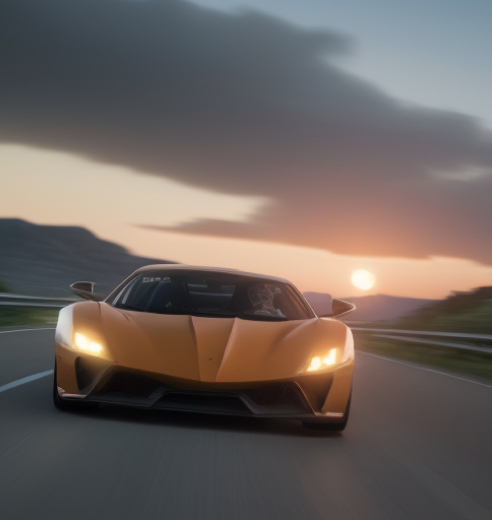

In [ ]:
# 加载一张超级跑车的图像
car_path = "https://raw.githubusercontent.com/HandsOnLLM/Hands-On-Large-Language-Models/main/chapter09/images/car.png"
image = Image.open(urlopen(car_path)).convert("RGB")
image

In [ ]:
# 图像预处理
inputs = blip_processor(image, return_tensors="pt").to(device, torch.float16)
inputs["pixel_values"].shape

torch.Size([1, 3, 224, 224])

结果是一个224 x 224大小的图像，比我们最初的图像要小得多！这也意味着图像的所有原始不同形状将被处理成正方形。因此，在输入非常宽或非常高的图像时要小心，因为它们可能会失真。

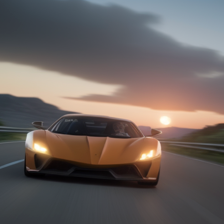

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# 转换为numpy格式，并将形状从(1, 3, 224, 224)变为(224, 224, 3)
image_inputs = inputs["pixel_values"][0].detach().cpu().numpy()
image_inputs = np.einsum('ijk->kji', image_inputs)
image_inputs = np.einsum('ijk->jik', image_inputs)

# 将图像输入缩放到0-255，以表示RGB值
scaler = MinMaxScaler(feature_range=(0, 255))
image_inputs = scaler.fit_transform(image_inputs.reshape(-1, image_inputs.shape[-1])).reshape(image_inputs.shape)
image_inputs = np.array(image_inputs, dtype=np.uint8)

# 将numpy数组转换为图像
Image.fromarray(image_inputs)

### 文本预处理

让我们继续探索处理器对文本的处理。首先，我们可以访问用于对输入文本进行分词的分词器：

In [ ]:
blip_processor.tokenizer

GPT2TokenizerFast(name_or_path='Salesforce/blip2-opt-2.7b', vocab_size=50265, model_max_length=1000000000000000019884624838656, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '</s>', 'eos_token': '</s>', 'unk_token': '</s>', 'pad_token': '<pad>'}, clean_up_tokenization_spaces=True),  added_tokens_decoder={
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
}

BLIP-2模型在此使用了GPT2Tokenizer。正如我们在第2章中探讨的那样，分词器处理输入文本的方式可能会有很大差异。为了探究GPT2Tokenizer的工作原理，我们可以尝试将一个简单的句子进行测试。我们首先将句子转换为token IDs，然后再将其转换回tokens：

In [ ]:
# 文本预处理
text = "Her vocalization was remarkably melodic"
token_ids = blip_processor(image, text=text, return_tensors="pt")
token_ids = token_ids.to(device, torch.float16)["input_ids"][0]

# 将输入ID转换回标记
tokens = blip_processor.tokenizer.convert_ids_to_tokens(token_ids)
tokens

['</s>', 'Her', 'Ġvocal', 'ization', 'Ġwas', 'Ġremarkably', 'Ġmel', 'odic']

我们会注意到一些标记开头有一个奇怪的符号，即G符号。这实际上表示一个空格。然而，内部功能将某些代码点中的字符移动了256，以便使其可打印。因此，空格（代码点32）变为G（代码点288）。我们将它们转换为下划线以便于说明：这为我们提供了一个更好看的输出：输出表明下划线表示一个单词的开始。这样，由多个标记组成的词就可以被识别出来。

In [ ]:
# 将空格标记替换为下划线
tokens = [token.replace("Ġ", "_") for token in tokens]
tokens

['</s>', 'Her', '_vocal', 'ization', '_was', '_remarkably', '_mel', 'odic']

### 例子1：图像描述生成

像BLIP-2这样的模型最直接的应用就是为数据中的图像创建标题。图像被转换为模型可以读取的像素值。这些像素值被传递给BLIP-2，以转换为LLM可以用来决定适当标题的软视觉提示。让我们以一辆超级跑车的图像为例，使用处理器来推导出预期形状的像素：

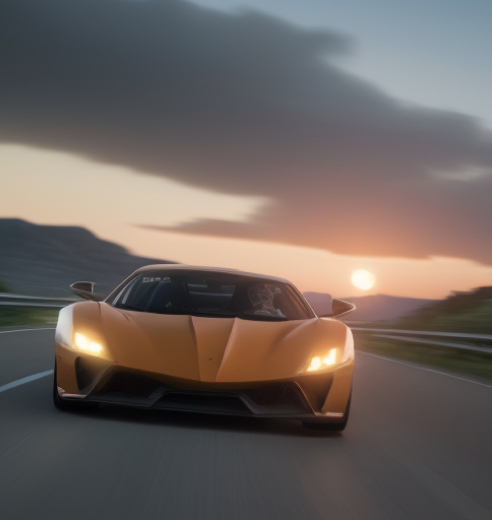

In [ ]:
# 加载一张人工智能生成的超级跑车图像
image = Image.open(urlopen(car_path)).convert("RGB")

# 将图像转换为输入并进行预处理
inputs = blip_processor(image, return_tensors="pt").to(device, torch.float16)
image

In [ ]:
# 生成图像ID，以便传递给解码器（大语言模型）
generated_ids = model.generate(**inputs, max_new_tokens=20)

# 从图像ID生成文本
generated_text = blip_processor.batch_decode(generated_ids, skip_special_tokens=True)
generated_text = generated_text[0].strip()
generated_text

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
Both `max_new_tokens` (=20) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


'an orange supercar driving on the road at sunset'

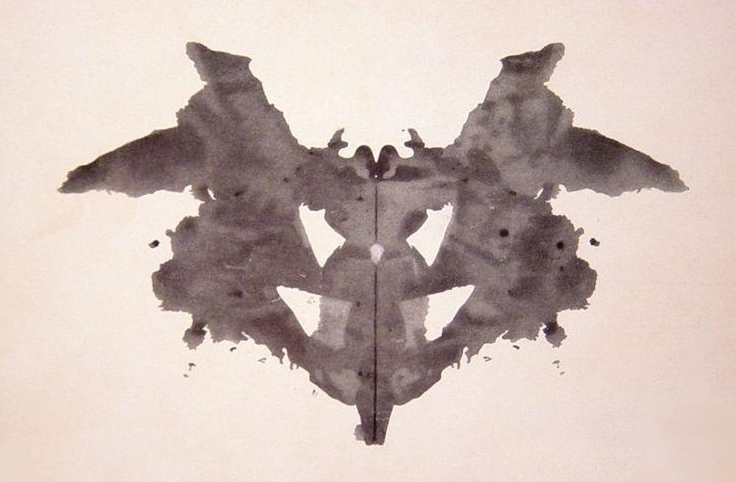

In [ ]:
url = "https://upload.wikimedia.org/wikipedia/commons/7/70/Rorschach_blot_01.jpg"
image = Image.open(urlopen(url)).convert("RGB")
image

In [ ]:
# 罗夏墨迹测试中的一幅图。你在其中看到了什么？
url = "https://upload.wikimedia.org/wikipedia/commons/7/70/Rorschach_blot_01.jpg"
image = Image.open(urlopen(url)).convert("RGB")

# 生成文本说明
inputs = blip_processor(image, return_tensors="pt").to(device, torch.float16)
generated_ids = model.generate(**inputs, max_new_tokens=20)
generated_text = blip_processor.batch_decode(generated_ids, skip_special_tokens=True)
generated_text = generated_text[0].strip()
generated_text

Both `max_new_tokens` (=20) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


'a black and white ink drawing of a bat'

一幅黑白墨水绘制的蝙蝠画作。

### 例子2：视觉问答

尽管字幕生成是一项重要的任务，但我们可以进一步拓展其使用范围。在之前的例子中，我们展示了从一种模态（视觉图像）转换到另一种模态（文本字幕）。与其遵循这种线性结构，我们不妨尝试同时呈现这两种模态，即进行所谓的视觉问答。在这个特定的用例中，我们给模型提供了一幅图像以及一个关于该图像的问题，要求其作答。模型需要同时处理图像和问题。为了演示这一点，让我们以一辆汽车的图片作为起点，并要求BLIP-2描述该图像。为此，我们首先需要像之前几次那样预处理图像。

In [ ]:
# 加载一张由人工智能生成的超级跑车图像
image = Image.open(urlopen(car_path)).convert("RGB")

为了执行我们的视觉问答任务，我们需要为BLIP-2提供的不仅仅是图像，还有提示。没有提示，模型将像之前一样生成图像的标题。我们将要求模型描述我们刚刚处理过的图像。

In [ ]:
# 视觉问答
prompt = "Question: Write down what you see in this picture. Answer:"

# 处理图像和提示
inputs = blip_processor(image, text=prompt, return_tensors="pt").to(device, torch.float16)

# 生成文本
generated_ids = model.generate(**inputs, max_new_tokens=30)
generated_text = blip_processor.batch_decode(generated_ids, skip_special_tokens=True)
generated_text = generated_text[0].strip()
generated_text

Both `max_new_tokens` (=30) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


'A sports car driving on the road at sunset'

夕阳下，一辆跑车行驶在道路上。它正确地描述了图像。接着，我们可以以聊天的方式提出后续问题。为此，我们可以向模型提供我们之前的对话，包括它对我们问题的回答。然后，我们再问它一个后续问题：

In [ ]:
# 聊天式提示
prompt = "Question: Write down what you see in this picture. Answer: A sports car driving on the road at sunset. Question: What would it cost me to drive that car? Answer:"

# 生成输出
inputs = blip_processor(image, text=prompt, return_tensors="pt").to(device, torch.float16)
generated_ids = model.generate(**inputs, max_new_tokens=30)
generated_text = blip_processor.batch_decode(generated_ids, skip_special_tokens=True)
generated_text = generated_text[0].strip()
generated_text

Both `max_new_tokens` (=30) and `max_length`(=51) seem to have been set. `max_new_tokens` will take precedence. Please refer to the documentation for more information. (https://huggingface.co/docs/transformers/main/en/main_classes/text_generation)


'$1,000,000'

1,000,000是非常具体的！这展示了BLIP-2的更多聊天行为，这使得一些有趣的对话成为可能。最后，我们可以通过使用ipywidgets创建一个交互式聊天机器人来使这个过程更加顺畅。ipywidgets是Jupyter笔记本的一个扩展，它允许我们创建交互式按钮、输入文本等功能。

In [ ]:
from IPython.display import HTML, display
import ipywidgets as widgets

def text_eventhandler(*args):
  question = args[0]["new"]
  if question:
    args[0]["owner"].value = ""

    # 创建提示
    if not memory:
      prompt = " Question: " + question + " Answer:"
    else:
      template = "Question: {} Answer: {}."
      prompt = " ".join(
          [
              template.format(memory[i][0], memory[i][1])
              for i in range(len(memory))
          ]
      ) + " Question: " + question + " Answer:"

    # 生成文本
    inputs = blip_processor(image, text=prompt, return_tensors="pt")
    inputs = inputs.to(device, torch.float16)
    generated_ids = model.generate(**inputs, max_new_tokens=100)
    generated_text = blip_processor.batch_decode(
        generated_ids,
        skip_special_tokens=True
    )
    generated_text = generated_text[0].strip().split("Question")[0]

    # 更新记忆
    memory.append((question, generated_text))

    # 分配给输出
    output.append_display_data(HTML("<b>USER:</b> " + question))
    output.append_display_data(HTML("<b>BLIP-2:</b> " + generated_text))
    output.append_display_data(HTML("<br>"))

# 准备界面组件
in_text = widgets.Text()
in_text.continuous_update = False
in_text.observe(text_eventhandler, "value")
output = widgets.Output()
memory = []

# 显示聊天框
display(
    widgets.VBox(
        children=[output, in_text],
        layout=widgets.Layout(display="inline-flex", flex_flow="column-reverse"),
    )
)

看来我们可以继续对话并提出一系列问题。通过这种基于聊天的方法，我们实际上创建了一个可以对图像进行推理的聊天机器人！

# 总结
在本章中，我们探讨了通过弥合文本和视觉表征之间的差距，使大语言模型（LLMs）实现多模态化的各种方法。我们首先讨论了视觉变换器，这些是将图像转换为数值表示的模型。这是通过使用图像编码器和图块嵌入实现的，使模型能够以各种尺度处理图像。然后我们探讨了创建嵌入模型的方法，这些模型可以使用CLIP将图像和文本都转换为数值表示。我们了解到，CLIP通过对比学习在共享空间中对齐图像和文本的嵌入，从而能够执行零样本分类、聚类和搜索等任务。本章还介绍了OpenCLIP，这是一种易于用于多模态嵌入任务的开源变体。最后，我们研究了如何使文本生成模型实现多模态化，并深入了解了BLIP-2模型。这些多模态文本生成模型的核心理念是将输入图像的视觉特征投影到LLMs可以使用的文本嵌入上。我们看到该模型可用于图像字幕生成和基于多模态聊天的提示，其中两种模态结合生成响应。总体而言，本章强调了多模态性在LLMs中的强大功能，并展示了其在图像字幕生成、搜索和基于聊天的提示等各个领域的应用。在本书的第三部分，我们将介绍训练和微调技术。在第十章中，我们将探讨如何创建和微调文本嵌入模型，这是一种驱动许多语言建模应用的核心技术。下一章将作为语言模型训练和微调的介绍。